# Deep Learning: A Simple Example

- Let's get back to the Name Gender Classifier.

![](../images/keras-workflow.png)

## Prepare Data

In [1]:
## Packages Dependencies
import os
import shutil
import numpy as np
import nltk
from nltk.corpus import names
import random

from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams['figure.dpi'] = 150
    
from lime.lime_text import LimeTextExplainer

import tensorflow
import tensorflow.keras as keras

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
    # from keras.layers import Dense
    # from keras.layers import LSTM, RNN, GRU
    # from keras.layers import Embedding
    # from keras.layers import SpatialDropout1D

import keras_tuner

2023-07-18 16:48:15.999540: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
labeled_names = ([(name, 1) for name in names.words('male.txt')] +
                 [(name, 0) for name in names.words('female.txt')])
random.shuffle(labeled_names)

## Train-Test Split

In [3]:
train_set, test_set = train_test_split(labeled_names,
                                       test_size=0.2,
                                       random_state=42)
print(len(train_set), len(test_set))

6355 1589


In [4]:
names = [n for (n, l) in train_set] ## X
labels = [l for (n, l) in train_set] ## y

In [5]:
len(names)

6355

## Tokenizer

- `keras.preprocessing.text.Tokenizer` is a very useful tokenizer for text processing in deep learning.
- `Tokenizer` assumes that the **word tokens** of the input texts have been delimited by whitespaces.
- `Tokenizer` provides the following functions:
    - It will first create a dictionary for the entire corpus (a mapping of each word token and its unique integer index index) (`Tokenizer.fit_on_text()`)
    - It can then use the corpus dictionary to convert **words** in each corpus text into **integer sequences** (`Tokenizer.texts_to_sequences()`)
    - The dictionary is in `Tokenizer.word_index`

- Notes on `Tokenizer`:
    - By default, the token index 0 is reserved for **padding token**.
    - If `oov_token` is specified, it is default to index 1. (Default: `oov_token=False`)
    - Specify `num_words=N` for `Tokenizer` to include only top N words in converting texts to sequences.
    - `Tokenizer` will automatically remove punctuations.
    - `Tokenizer` use the **whitespace** as word-token delimiter.
    - If every character is treated as a token, specify `char_level=True`.
    - Please read `Tokenizer` documentation very carefully. Very important!!

In [6]:
tokenizer = Tokenizer(char_level=True)
tokenizer.fit_on_texts(names) ## similar to CountVectorizer.fit_transform()

### Vocabulary

After we `Tokenizer.fit_on_texts()`, we can take a look at the corpus dictionary, i.e., the mapping of words and their unique integer indices.

In [7]:
# determine the vocabulary size
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 30


In [8]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'y': 11,
 'm': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

## Prepare Input and Output Tensors

- Like in feature-based machine learning, a computational model only accepts numeric values. It is necessary to convert raw texts to numeric tensors for neural network.
- After we create the `Tokenizer`, we use the `Tokenizer` to perform text vectorization, i.e., converting texts into tensors.
- In deep learning, words or characters are automatically converted into numeric representations. In other words, the feature engineering step is fully automatic.

### Two Ways of Text Vectorization

- Texts to Sequences:
    - For each text, we convert all word tokens into **integer sequences**.
    - These integer sequences will then be transformed into **embeddings** in the deep learning network.
    - These embeddings are usually the basis for deep learning sequence models (i.e., RNN).
    

- Texts to Matrix: 
    - For each text, we vectorize the entire text into a vector of bag-of-words representation.
    - A **One-hot encoding** of the entire text would have all values of the text vector to be either 0 or 1, indicating the occurrence of all the words in the dictionary.
    - We can of course use the frequency-based bag-of-words representation (similar to `CountVectorizer()`).

## Method 1: Text to Sequences

### From Texts and Sequences

- We can convert our corpus texts into integer sequences using `Tokenizer.texts_to_sequences()`.
- Because texts vary in lengths, we use `keras.preprocessing.sequence.pad_sequence()` to pad all texts into a uniform length.
- This step is important. This ensures that every text, when pushed into the network, has exactly the same **tensor shape**.

In [9]:
names_ints = tokenizer.texts_to_sequences(names)

In [10]:
print(names[:5])
print(names_ints[:5])
print(labels[:5])

['Perle', 'Wylie', 'Ginni', 'Cybel', 'Wally']
[[22, 2, 5, 6, 2], [23, 11, 6, 3, 2], [17, 3, 4, 4, 3], [14, 11, 15, 2, 6], [23, 1, 6, 6, 11]]
[0, 1, 0, 0, 0]


### Padding

- When padding the all texts into uniform lengths, consider whether to pad or remove values from the beginning of the sequence (i.e., `pre`) or the other way (`post`).
- Check `padding` and `truncating` parameters in `pad_sequences`
- In this tutorial, we first identify the longest name, and use its length as the `max_len` and pad all names into the `max_len`.

Helen-Elizabeth


/Users/alvinchen/opt/anaconda3/envs/python-notes-2023/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


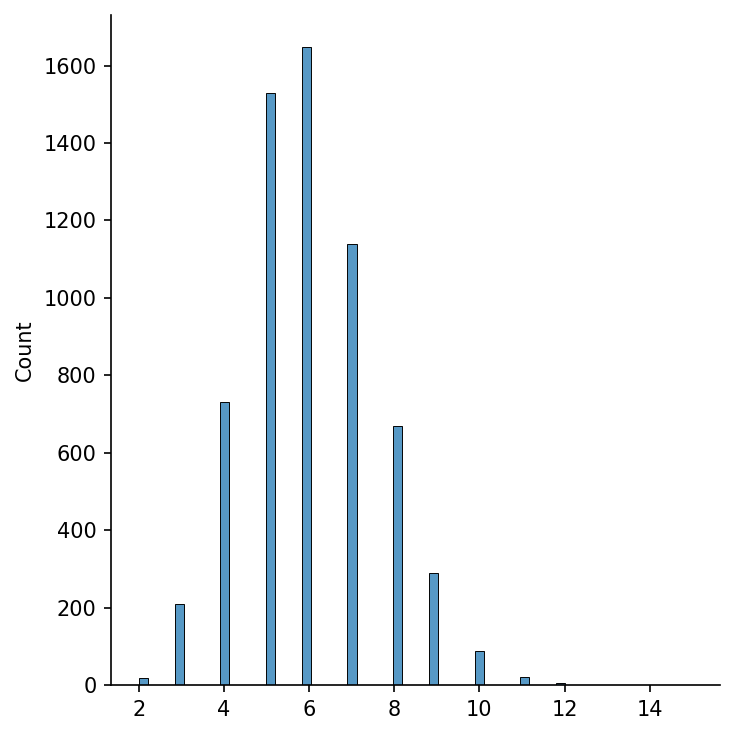

In [11]:
## We can check the length distribution of texts in corpus

names_lens = [len(n) for n in names_ints]
names_lens

sns.displot(names_lens)
print(names[np.argmax(names_lens)])  # longest name

In [12]:
max_len = names_lens[np.argmax(names_lens)]
max_len

15

In [13]:
names_ints_pad = sequence.pad_sequences(names_ints, maxlen=max_len)
names_ints_pad[:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 22,  2,  5,  6,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 23, 11,  6,  3,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 17,  3,  4,  4,  3],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14, 11, 15,  2,  6],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 23,  1,  6,  6, 11],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  9, 13,  1,  4,  1,  4],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 12,  1,  5, 14],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  6, 16,  6,  3,  8,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  8, 13,  2, 10,  5,  3, 14, 18],
       [ 0,  0,  0,  0,  0, 14, 13,  5,  3,  9,  8,  3,  1,  4,  1]],
      dtype=int32)

### Define X and y

- So for names, we convert names into integer sequences, and pad them into the uniform length.
- We perform exactly the same processing to the names in testing data.
- We convert both the names (X) and labels (y) into `numpy.array`.

In [14]:
## training data
X_train = np.array(names_ints_pad).astype('int32')
y_train = np.array(labels)


## testing data
X_test_texts = [n for (n, l) in test_set]
X_test = np.array(
    sequence.pad_sequences(tokenizer.texts_to_sequences(X_test_texts),
                           maxlen=max_len)).astype('int32')
y_test = np.array([l for (n, l) in test_set])

In [15]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6355, 15)
(6355,)
(1589, 15)
(1589,)


## Method 2: Text to Matrix

### One-Hot Encoding (Bag-of-Words)

- We can convert each text to a bag-of-words vector using `Tokenzier.texts_to_matrix()`.
- In particular, we can specify the parameter `mode`: `binary`, `count`, or `tfidf`.
- When the `mode="binary"`, the text vector is a **one-hot encoding** vector, indicating whether a character occurs in the text or not.

In [16]:
names_matrix = tokenizer.texts_to_matrix(names, mode="binary")
print(names_matrix.shape)

(6355, 30)


In [17]:
print(names[2])
print(names_matrix[2,:])

Ginni
[0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]


In [18]:
tokenizer.word_index

{'a': 1,
 'e': 2,
 'i': 3,
 'n': 4,
 'r': 5,
 'l': 6,
 'o': 7,
 't': 8,
 's': 9,
 'd': 10,
 'y': 11,
 'm': 12,
 'h': 13,
 'c': 14,
 'b': 15,
 'u': 16,
 'g': 17,
 'k': 18,
 'j': 19,
 'v': 20,
 'f': 21,
 'p': 22,
 'w': 23,
 'z': 24,
 'x': 25,
 'q': 26,
 '-': 27,
 ' ': 28,
 "'": 29}

### Define X and Y

In [19]:
X_train2 = np.array(names_matrix).astype('int32')
y_train2 = np.array(labels)

X_test2 = tokenizer.texts_to_matrix(X_test_texts,
                                    mode="binary").astype('int32')
y_test2 = np.array([l for (n, l) in test_set])

In [20]:
print(X_train2.shape)
print(y_train2.shape)
print(X_test2.shape)
print(y_test2.shape)

(6355, 30)
(6355,)
(1589, 30)
(1589,)


## Model Definition

- Three important steps for building a deep neural network:
    - **Define** the model structure 
    - **Compile** the model
    - **Fit** the model

- After we have defined our input and output tensors (X and y), we can define the **architecture** of our neural network model.
- For the two ways of *name* vectorized representations, we try two different types of networks.
    - **Text to Matrix**: Fully connected Dense Layers
    - **Text to Sequences**: Embedding + RNN


In [21]:
# Two Versions of Plotting Functions for `history` from `model.fit()`
def plot1(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)
    ## Accuracy plot
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    ## Loss plot
    plt.figure()

    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.show()


def plot2(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    #plt.gca().set_ylim(0,1)
    plt.show()

### Model 1: Fully Connected Dense Layers

- Let's try a simple neural network with two fully-connected dense layers with the Text-to-Matrix inputs.
- That is, the input of this model is the bag-of-words representation of the entire name.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.002.jpeg)

#### Dense Layer Operation

- The transformation of each Dense layer will transform the input tensor into a tensor whose dimension size is the same as the node number of the Dense layer.

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.003.jpeg)

In [22]:
## Define Model
model1 = keras.Sequential()
model1.add(keras.Input(shape=(vocab_size, ), name="one_hot_input"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_1"))
model1.add(layers.Dense(16, activation="relu", name="dense_layer_2"))
model1.add(layers.Dense(1, activation="sigmoid", name="output"))

2023-07-18 16:48:23.098810: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [23]:
## Compile Model
model1.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])

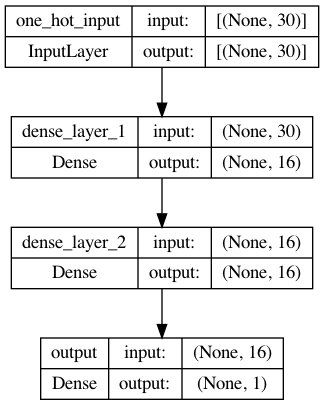

In [24]:
plot_model(model1, show_shapes=True)

#### A few hyperparameters for network training

- Batch Size: The number of inputs needed per update of the model parameter (gradient descent)
- Epoch: How many iterations needed for training
- Validation Split Ratio: Proportion of validation and training data split

In [25]:
## Hyperparameters
BATCH_SIZE = 128
EPOCHS = 20
VALIDATION_SPLIT = 0.2

In [26]:
## Fit the model
history1 = model1.fit(X_train2,
                      y_train2,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20
40/40 - 1s - loss: 0.7343 - accuracy: 0.4451 - val_loss: 0.6634 - val_accuracy: 0.6137 - 965ms/epoch - 24ms/step
Epoch 2/20
40/40 - 0s - loss: 0.6547 - accuracy: 0.6263 - val_loss: 0.6340 - val_accuracy: 0.6444 - 63ms/epoch - 2ms/step
Epoch 3/20
40/40 - 0s - loss: 0.6408 - accuracy: 0.6288 - val_loss: 0.6212 - val_accuracy: 0.6483 - 62ms/epoch - 2ms/step
Epoch 4/20
40/40 - 0s - loss: 0.6303 - accuracy: 0.6357 - val_loss: 0.6091 - val_accuracy: 0.6546 - 59ms/epoch - 1ms/step
Epoch 5/20
40/40 - 0s - loss: 0.6200 - accuracy: 0.6479 - val_loss: 0.5986 - val_accuracy: 0.6743 - 60ms/epoch - 2ms/step
Epoch 6/20
40/40 - 0s - loss: 0.6096 - accuracy: 0.6672 - val_loss: 0.5868 - val_accuracy: 0.7026 - 59ms/epoch - 1ms/step
Epoch 7/20
40/40 - 0s - loss: 0.6008 - accuracy: 0.6794 - val_loss: 0.5784 - val_accuracy: 0.7057 - 61ms/epoch - 2ms/step
Epoch 8/20


40/40 - 0s - loss: 0.5931 - accuracy: 0.6902 - val_loss: 0.5686 - val_accuracy: 0.7105 - 58ms/epoch - 1ms/step
Epoch 9/20
40/40 - 0s - loss: 0.5887 - accuracy: 0.6892 - val_loss: 0.5643 - val_accuracy: 0.7183 - 68ms/epoch - 2ms/step
Epoch 10/20
40/40 - 0s - loss: 0.5844 - accuracy: 0.6943 - val_loss: 0.5594 - val_accuracy: 0.7152 - 79ms/epoch - 2ms/step
Epoch 11/20
40/40 - 0s - loss: 0.5821 - accuracy: 0.6971 - val_loss: 0.5606 - val_accuracy: 0.7199 - 61ms/epoch - 2ms/step
Epoch 12/20
40/40 - 0s - loss: 0.5801 - accuracy: 0.7012 - val_loss: 0.5569 - val_accuracy: 0.7215 - 70ms/epoch - 2ms/step
Epoch 13/20
40/40 - 0s - loss: 0.5784 - accuracy: 0.7034 - val_loss: 0.5538 - val_accuracy: 0.7231 - 82ms/epoch - 2ms/step
Epoch 14/20
40/40 - 0s - loss: 0.5767 - accuracy: 0.7040 - val_loss: 0.5530 - val_accuracy: 0.7262 - 87ms/epoch - 2ms/step
Epoch 15/20
40/40 - 0s - loss: 0.5749 - accuracy: 0.7085 - val_loss: 0.5538 - val_accuracy: 0.7270 - 83ms/epoch - 2ms/step
Epoch 16/20
40/40 - 0s - loss

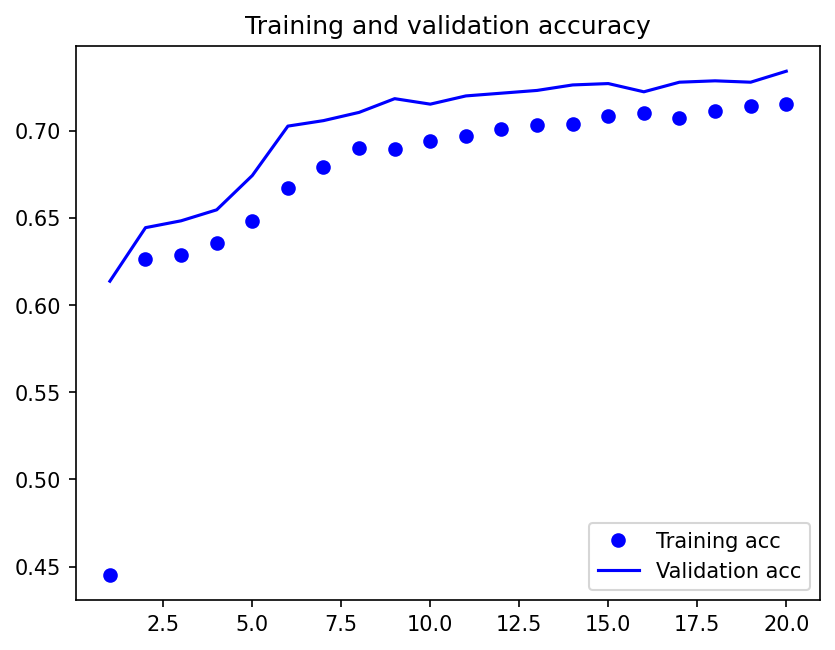

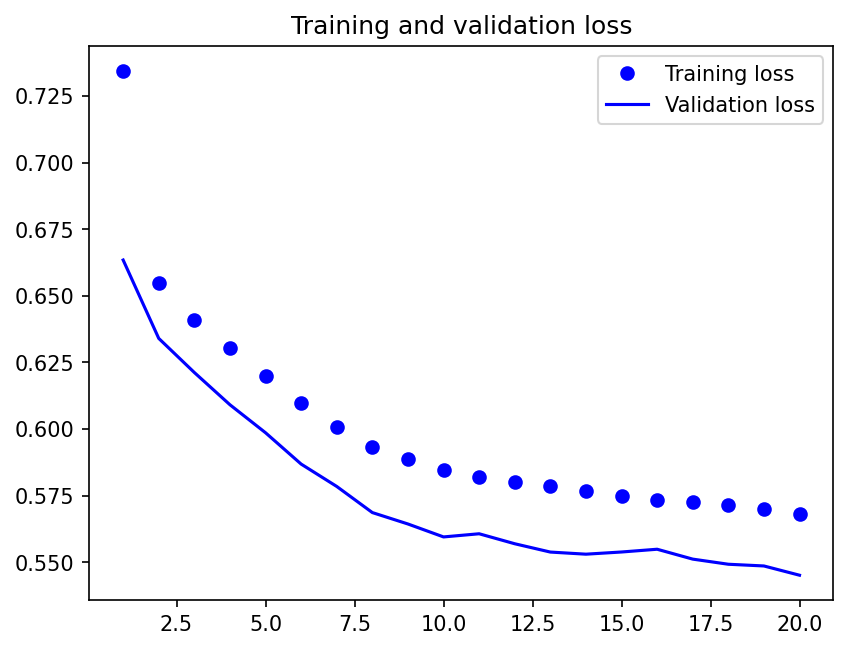

In [27]:
plot1(history1)

In [28]:
model1.evaluate(X_test2, y_test2, batch_size=BATCH_SIZE, verbose=2)

13/13 - 0s - loss: 0.5554 - accuracy: 0.7281 - 30ms/epoch - 2ms/step


[0.5553682446479797, 0.7281308770179749]

### Model 2: Embedding + RNN

- Another possibility is to introduce an embedding layer in the network, which transforms each **character** of the name into a tensor (i.e., embeddings), and then we add a Recurrent Neural Network (RNN) layer to process each character sequentially.
- The strength of the RNN is that it iterates over the **timesteps** of a sequence, while maintaining an internal state that encodes information about the **timesteps** it has seen so far.
- It is posited that after the RNN iterates through the entire sequence, it keeps important information of all previously iterated tokens for further operation.
- The input of this network is a padded sequence of the original text (name).

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.004.jpeg)

In [29]:
## Define the embedding dimension
EMBEDDING_DIM = 128

## Define model
model2 = Sequential()
model2.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model2.add(layers.SimpleRNN(16, activation="relu", name="RNN_layer"))
model2.add(layers.Dense(16, activation="relu", name="dense_layer"))
model2.add(layers.Dense(1, activation="sigmoid", name="output"))

model2.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])

#### Embedding Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.005.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.006.jpeg)

#### RNN Layer Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.007.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.008.jpeg)

#### Unrolled Version of RNN Operation

![](../images/name-gender-classifier-dl/name-gender-classifier-dl.009.jpeg)

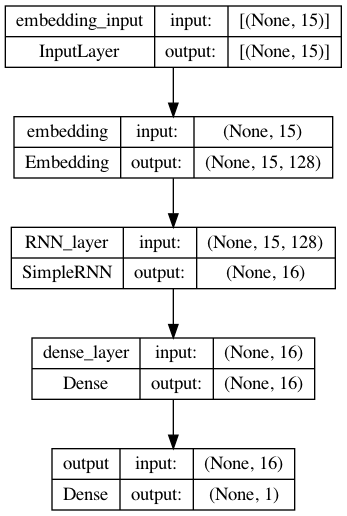

In [30]:
plot_model(model2, show_shapes=True)

In [31]:
history2 = model2.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20


40/40 - 2s - loss: 0.6554 - accuracy: 0.6261 - val_loss: 0.5775 - val_accuracy: 0.6908 - 2s/epoch - 59ms/step
Epoch 2/20
40/40 - 0s - loss: 0.5329 - accuracy: 0.7266 - val_loss: 0.4531 - val_accuracy: 0.8017 - 368ms/epoch - 9ms/step
Epoch 3/20
40/40 - 0s - loss: 0.4555 - accuracy: 0.7762 - val_loss: 0.4216 - val_accuracy: 0.8096 - 237ms/epoch - 6ms/step
Epoch 4/20
40/40 - 0s - loss: 0.4378 - accuracy: 0.7889 - val_loss: 0.4108 - val_accuracy: 0.8112 - 230ms/epoch - 6ms/step
Epoch 5/20
40/40 - 0s - loss: 0.4242 - accuracy: 0.7992 - val_loss: 0.4065 - val_accuracy: 0.8127 - 234ms/epoch - 6ms/step
Epoch 6/20
40/40 - 0s - loss: 0.4178 - accuracy: 0.8021 - val_loss: 0.4006 - val_accuracy: 0.8096 - 237ms/epoch - 6ms/step
Epoch 7/20
40/40 - 0s - loss: 0.4109 - accuracy: 0.8076 - val_loss: 0.3965 - val_accuracy: 0.8175 - 241ms/epoch - 6ms/step
Epoch 8/20
40/40 - 0s - loss: 0.4048 - accuracy: 0.8065 - val_loss: 0.4022 - val_accuracy: 0.8143 - 354ms/epoch - 9ms/step
Epoch 9/20
40/40 - 0s - loss:

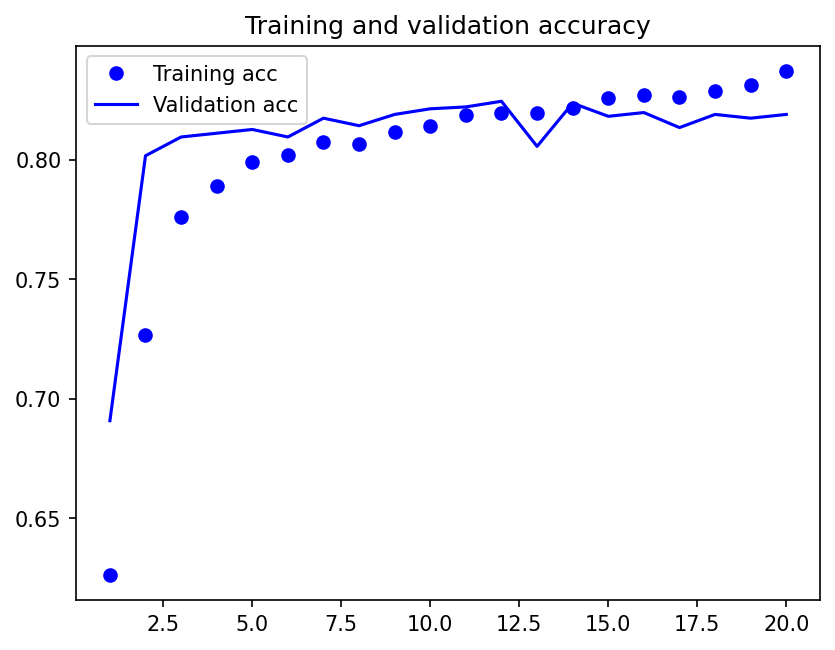

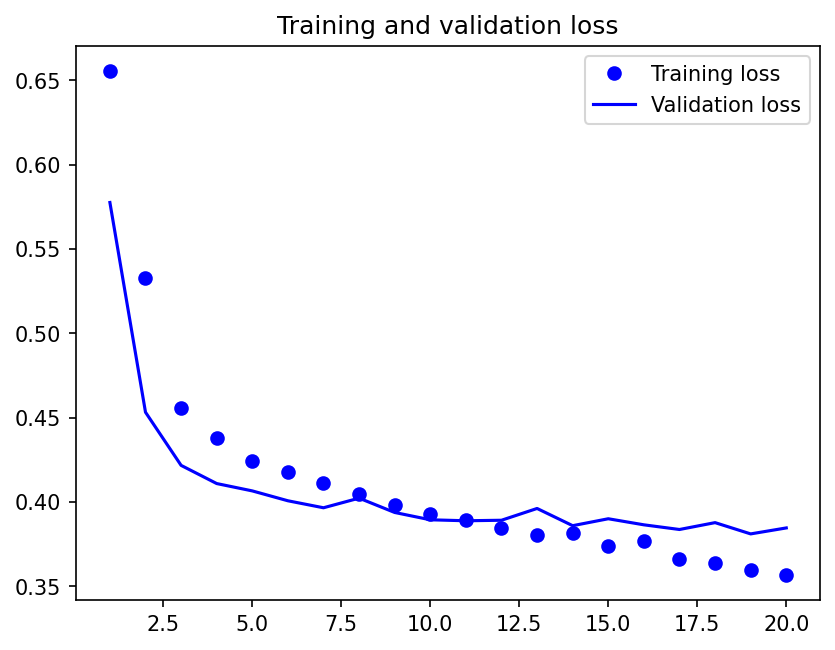

In [32]:
plot1(history2)

In [33]:
model2.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=2)

13/13 - 0s - loss: 0.3853 - accuracy: 0.8131 - 61ms/epoch - 5ms/step


[0.3852890133857727, 0.8130899667739868]

### Model 3: Regularization and Dropout

- Based on the validation results of the previous two models (esp. the RNN-based model), we can see that they are probably a bit overfit because the model performance on the validation set starts to **stall** after the first few epochs.
- We can add **regularization** and **dropouts** in our network definition to avoid overfitting.

In [34]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model3 = Sequential()
model3.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model3.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer",
                     dropout=0.2, ## dropout for input character
                     recurrent_dropout=0.2))  ## dropout for previous state
model3.add(layers.Dense(16, activation="relu", name="dense_layer"))
model3.add(layers.Dense(1, activation="sigmoid", name="output"))

model3.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])

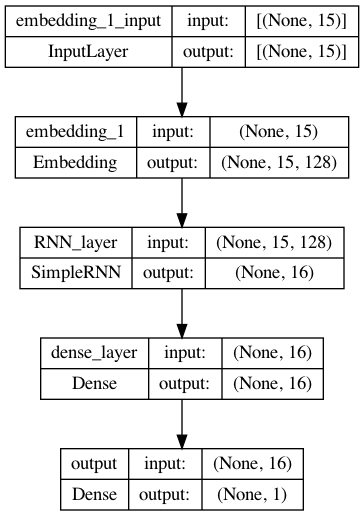

In [35]:
plot_model(model3, show_shapes=True)

In [36]:
history3 = model3.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20


40/40 - 3s - loss: 0.6233 - accuracy: 0.6349 - val_loss: 0.5379 - val_accuracy: 0.7010 - 3s/epoch - 63ms/step
Epoch 2/20
40/40 - 0s - loss: 0.5261 - accuracy: 0.7197 - val_loss: 0.4769 - val_accuracy: 0.7648 - 320ms/epoch - 8ms/step
Epoch 3/20
40/40 - 0s - loss: 0.4852 - accuracy: 0.7563 - val_loss: 0.4510 - val_accuracy: 0.7789 - 322ms/epoch - 8ms/step
Epoch 4/20
40/40 - 0s - loss: 0.4688 - accuracy: 0.7618 - val_loss: 0.4282 - val_accuracy: 0.7970 - 271ms/epoch - 7ms/step
Epoch 5/20
40/40 - 0s - loss: 0.4564 - accuracy: 0.7691 - val_loss: 0.4239 - val_accuracy: 0.7978 - 286ms/epoch - 7ms/step
Epoch 6/20
40/40 - 0s - loss: 0.4514 - accuracy: 0.7742 - val_loss: 0.4114 - val_accuracy: 0.8127 - 269ms/epoch - 7ms/step
Epoch 7/20
40/40 - 0s - loss: 0.4485 - accuracy: 0.7738 - val_loss: 0.4148 - val_accuracy: 0.7986 - 321ms/epoch - 8ms/step
Epoch 8/20
40/40 - 0s - loss: 0.4445 - accuracy: 0.7807 - val_loss: 0.4063 - val_accuracy: 0.8080 - 319ms/epoch - 8ms/step
Epoch 9/20
40/40 - 0s - loss:

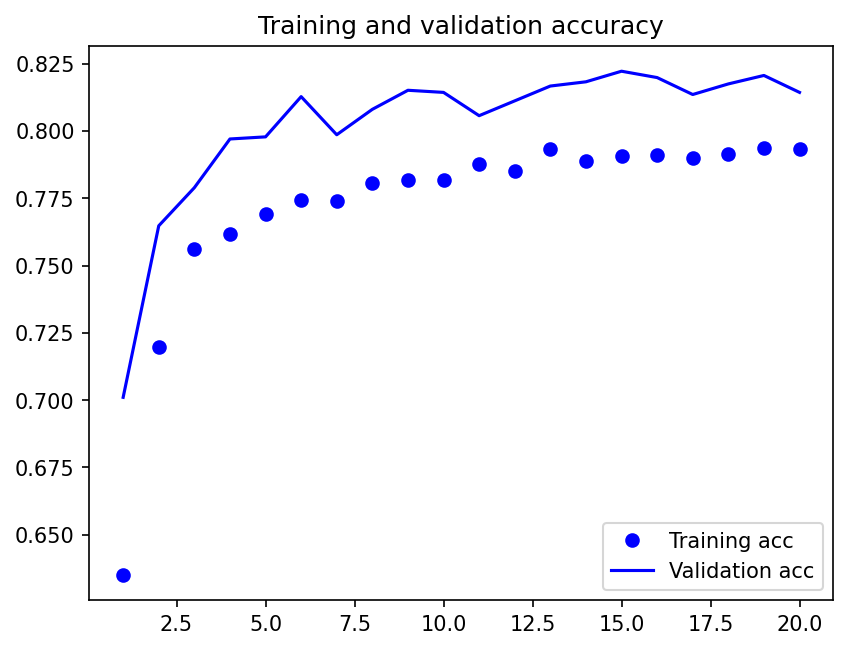

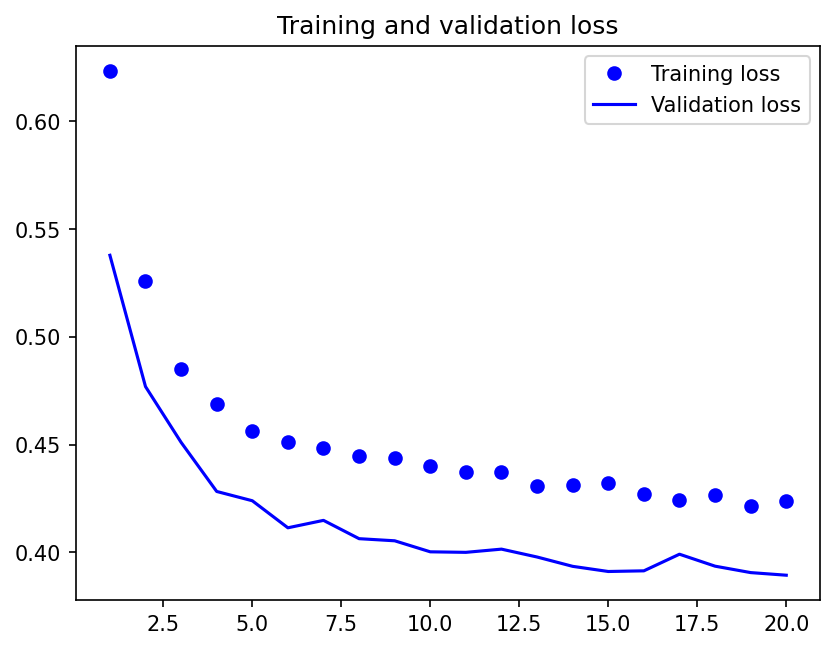

In [37]:
plot1(history3)

In [38]:
model3.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=2)

13/13 - 0s - loss: 0.3945 - accuracy: 0.8043 - 52ms/epoch - 4ms/step


[0.3944885730743408, 0.8042794466018677]

### Model 4: Improve the Models

- In addition to regularization and dropouts, we can further improve the model by increasing the model **complexity**.
- In particular, we can increase the **depths** and **widths** of the network layers.
- Let's try stacking two RNN layers.

:::{tip}

When we stack two sequence layers (e.g., RNN), we need to make sure that the hidden states (outputs) of the first sequence layer at **all timesteps** are properly passed onto the next sequence layer, not just the hidden state (output) of the last timestep.

In keras, this usually means that we need to set the argument `return_sequences=True` in a sequence layer (e.g., `SimpleRNN`, `LSTM`, `GRU` etc).

:::

In [39]:
## Define embedding dimension
MBEDDING_DIM = 128

## Define model
model4 = Sequential()
model4.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_1",
                     dropout=0.2,
                     recurrent_dropout=0.2,
                     return_sequences=True) 
)  ## To ensure the hidden states of all timesteps are pased down to next layer
model4.add(
    layers.SimpleRNN(16,
                     activation="relu",
                     name="RNN_layer_2",
                     dropout=0.2,
                     recurrent_dropout=0.2))
model4.add(layers.Dense(1, activation="sigmoid", name="output"))

## Compile model
model4.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])

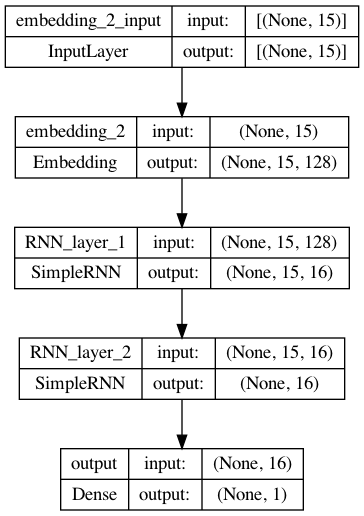

In [40]:
plot_model(model4, show_shapes=True)

In [41]:
history4 = model4.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20


40/40 - 3s - loss: 0.6450 - accuracy: 0.6241 - val_loss: 0.5714 - val_accuracy: 0.6428 - 3s/epoch - 86ms/step
Epoch 2/20
40/40 - 0s - loss: 0.5687 - accuracy: 0.6678 - val_loss: 0.4977 - val_accuracy: 0.7435 - 418ms/epoch - 10ms/step
Epoch 3/20
40/40 - 0s - loss: 0.5119 - accuracy: 0.7329 - val_loss: 0.4582 - val_accuracy: 0.7876 - 401ms/epoch - 10ms/step
Epoch 4/20
40/40 - 0s - loss: 0.4916 - accuracy: 0.7476 - val_loss: 0.4376 - val_accuracy: 0.7946 - 382ms/epoch - 10ms/step
Epoch 5/20
40/40 - 0s - loss: 0.4713 - accuracy: 0.7644 - val_loss: 0.4253 - val_accuracy: 0.8057 - 388ms/epoch - 10ms/step
Epoch 6/20
40/40 - 1s - loss: 0.4682 - accuracy: 0.7679 - val_loss: 0.4238 - val_accuracy: 0.8017 - 504ms/epoch - 13ms/step
Epoch 7/20
40/40 - 0s - loss: 0.4604 - accuracy: 0.7734 - val_loss: 0.4189 - val_accuracy: 0.8049 - 383ms/epoch - 10ms/step
Epoch 8/20
40/40 - 0s - loss: 0.4567 - accuracy: 0.7726 - val_loss: 0.4167 - val_accuracy: 0.8096 - 392ms/epoch - 10ms/step
Epoch 9/20
40/40 - 0s 

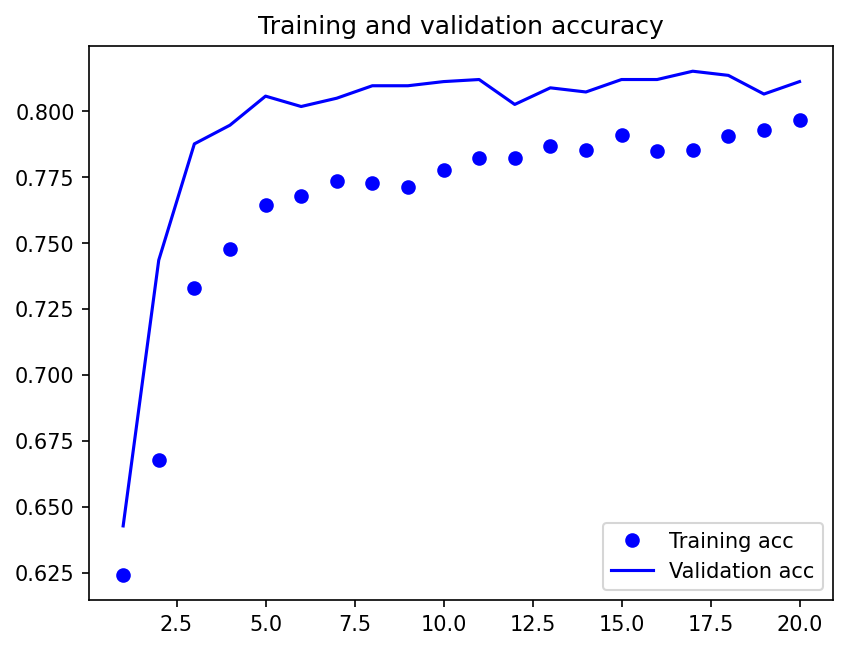

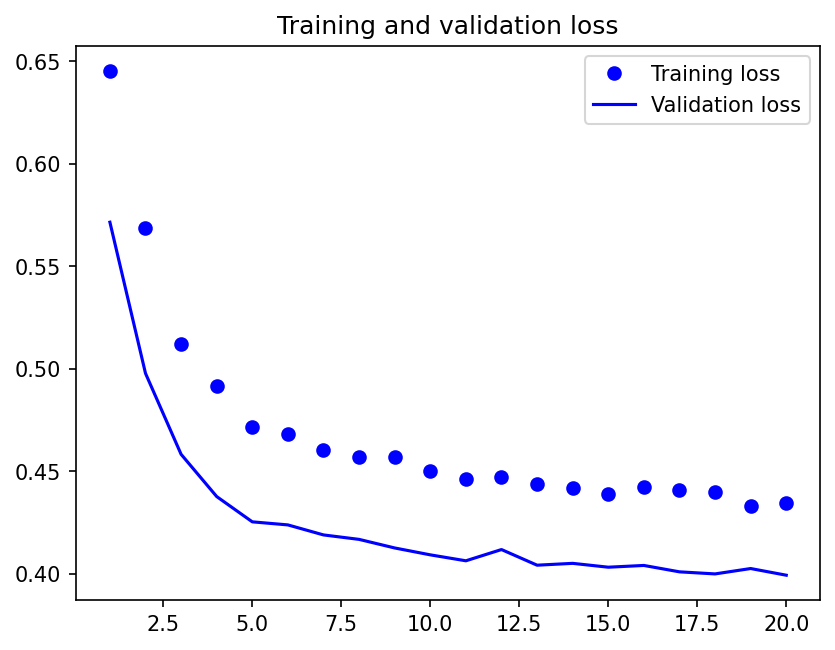

In [42]:
plot1(history4)

In [43]:
model4.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=2)

13/13 - 0s - loss: 0.3977 - accuracy: 0.8024 - 57ms/epoch - 4ms/step


[0.397655725479126, 0.8023914694786072]

### Model 5: Bidirectional

- We can also increase the model complexity in at least two possible ways:
    - Use more advanced RNNs, such as LSTM or GRU
    - Process the sequence in two directions
    - Increase the hidden nodes of the RNN/LSTM
- Now let's try the more sophisticated RNN, LSTM, and with bidirectional sequence processing and add more nodes to the LSTM layer.

In [44]:
## Define embedding dimension
EMBEDDING_DIM = 128

## Define model
model5 = Sequential()
model5.add(
    layers.Embedding(input_dim=vocab_size,
                      output_dim=EMBEDDING_DIM,
                      input_length=max_len,
                      mask_zero=True))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_1",
                    dropout=0.2,
                    recurrent_dropout=0.5,
                    return_sequences=True)))
model5.add(
    layers.Bidirectional(  ## Bidirectional sequence processing
        layers.LSTM(32,
                    activation="relu",
                    name="lstm_layer_2",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model5.add(layers.Dense(1, activation="sigmoid", name="output"))

model5.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])

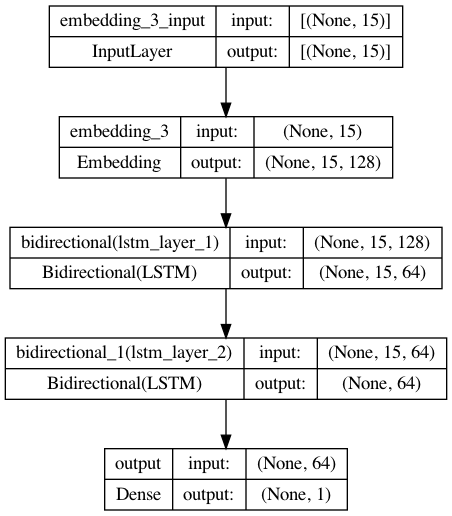

In [45]:
plot_model(model5, show_shapes=True)

In [46]:
history5 = model5.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20


40/40 - 14s - loss: 0.6634 - accuracy: 0.6178 - val_loss: 0.6128 - val_accuracy: 0.6428 - 14s/epoch - 349ms/step
Epoch 2/20
40/40 - 2s - loss: 0.6068 - accuracy: 0.6298 - val_loss: 0.5543 - val_accuracy: 0.6814 - 2s/epoch - 40ms/step
Epoch 3/20
40/40 - 2s - loss: 0.5333 - accuracy: 0.7191 - val_loss: 0.4790 - val_accuracy: 0.7710 - 2s/epoch - 41ms/step
Epoch 4/20
40/40 - 2s - loss: 0.4927 - accuracy: 0.7543 - val_loss: 0.4413 - val_accuracy: 0.7907 - 2s/epoch - 42ms/step
Epoch 5/20
40/40 - 2s - loss: 0.4691 - accuracy: 0.7675 - val_loss: 0.4268 - val_accuracy: 0.8017 - 2s/epoch - 41ms/step
Epoch 6/20
40/40 - 2s - loss: 0.4544 - accuracy: 0.7785 - val_loss: 0.4143 - val_accuracy: 0.8002 - 2s/epoch - 41ms/step
Epoch 7/20
40/40 - 2s - loss: 0.4464 - accuracy: 0.7876 - val_loss: 0.4061 - val_accuracy: 0.8120 - 2s/epoch - 43ms/step
Epoch 8/20
40/40 - 2s - loss: 0.4395 - accuracy: 0.7842 - val_loss: 0.4090 - val_accuracy: 0.8049 - 2s/epoch - 42ms/step
Epoch 9/20
40/40 - 2s - loss: 0.4351 - a

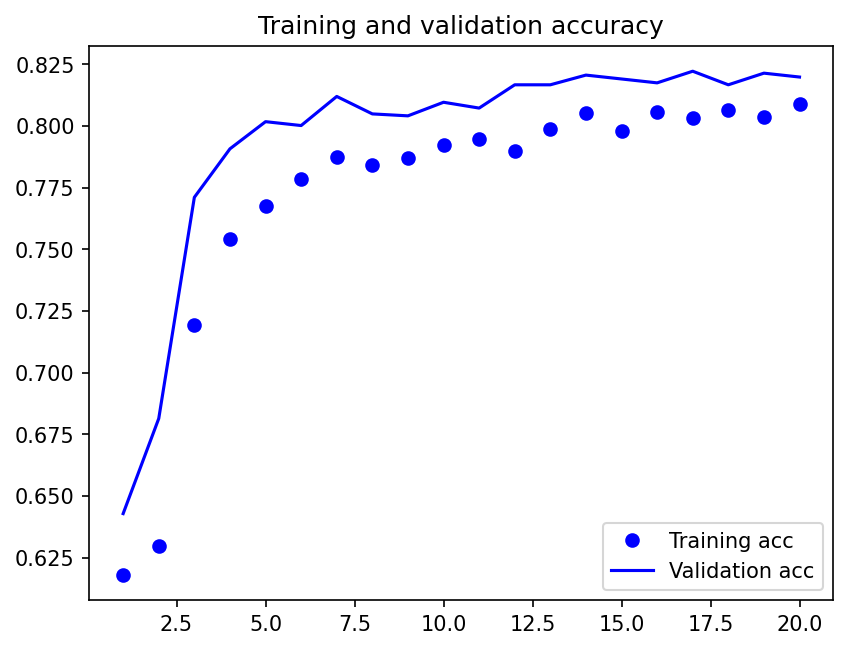

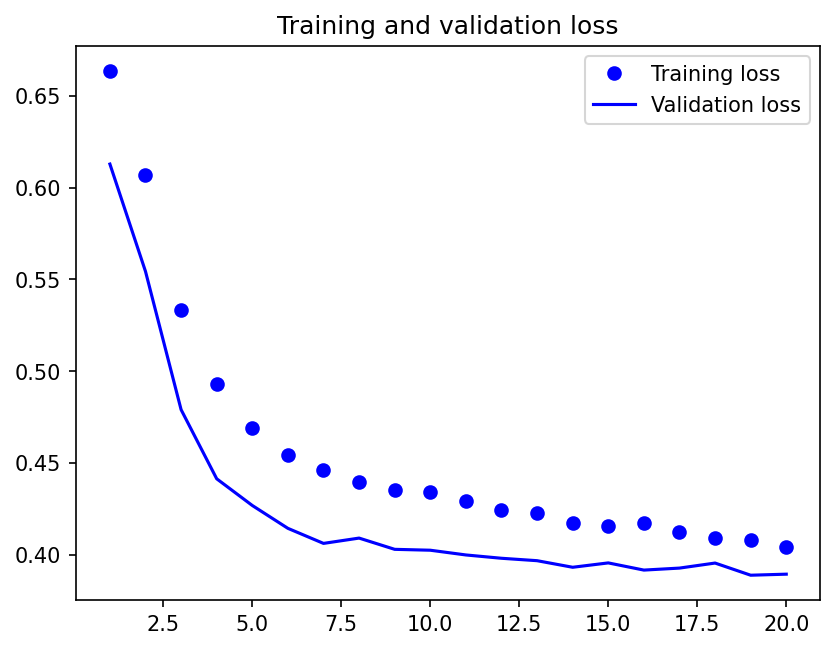

In [47]:
plot1(history5)

In [48]:
model5.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=2)

13/13 - 0s - loss: 0.3836 - accuracy: 0.8143 - 126ms/epoch - 10ms/step


[0.3836483359336853, 0.8143486380577087]

## Check Embeddings

- Compared to one-hot encodings of characters, embeddings may include more information relating to the characteristics (semantics?) of the characters.
- We can extract the embedding layer and apply dimensional reduction techniques (i.e., TSNE) to see how embeddings capture the relationships in-between characters.

In [49]:
## A name in sequence from test set
print(X_test_texts[10])
print(X_test[10])

Hakim
[ 0  0  0  0  0  0  0  0  0  0 13  1 18  3 12]


In [50]:
## Extract Corpus Dictionary (mapping of chars and integer indices)
ind2char = tokenizer.index_word
[ind2char.get(i) for i in X_test[10] if ind2char.get(i) != None]

['h', 'a', 'k', 'i', 'm']

In [51]:
## Extract the embedding layer (its weights matrix)
char_vectors = model5.layers[0].get_weights()[0]
print(char_vectors.shape) ## embedding shape (vocab_size, embed_dim)
print(char_vectors[1,:]) ## first char embeddings

(30, 128)
[ 0.13333914  0.05527809 -0.11465163  0.13180591  0.05255741 -0.0675967
  0.14409105  0.06426604 -0.0961421  -0.07177454  0.07597846  0.02400339
  0.0384569  -0.05152911  0.13483344 -0.12478112  0.16022746  0.09750984
  0.03879154  0.09111672  0.08092485  0.20390192  0.02229409  0.05292215
  0.04360208 -0.15887679 -0.11162124  0.03578277 -0.13369146 -0.07054479
  0.15630704 -0.01058865 -0.11660138  0.12367211  0.11883909 -0.05805654
  0.13390592 -0.1468063   0.14971016  0.09831496  0.12191103 -0.05763428
  0.12866025 -0.17703794 -0.06834511 -0.07851447  0.08113622  0.06146928
 -0.13626929  0.07511522 -0.09470214 -0.11044093 -0.13578865 -0.0600637
  0.04568402 -0.1172573  -0.0443738   0.10680068  0.07223113  0.1194302
  0.02624872  0.11242535  0.13259967 -0.09476662  0.1011143   0.02287611
  0.08628543  0.12760676 -0.06106142 -0.05930094  0.11234436 -0.11698261
 -0.12682533 -0.11511546 -0.10369992  0.17543623 -0.07791957  0.14503524
 -0.07284635  0.08939129 -0.1393231   0.0975

In [52]:
labels = [char for (ind, char) in tokenizer.index_word.items()]
labels.insert(0, None)
labels

[None,
 'a',
 'e',
 'i',
 'n',
 'r',
 'l',
 'o',
 't',
 's',
 'd',
 'y',
 'm',
 'h',
 'c',
 'b',
 'u',
 'g',
 'k',
 'j',
 'v',
 'f',
 'p',
 'w',
 'z',
 'x',
 'q',
 '-',
 ' ',
 "'"]

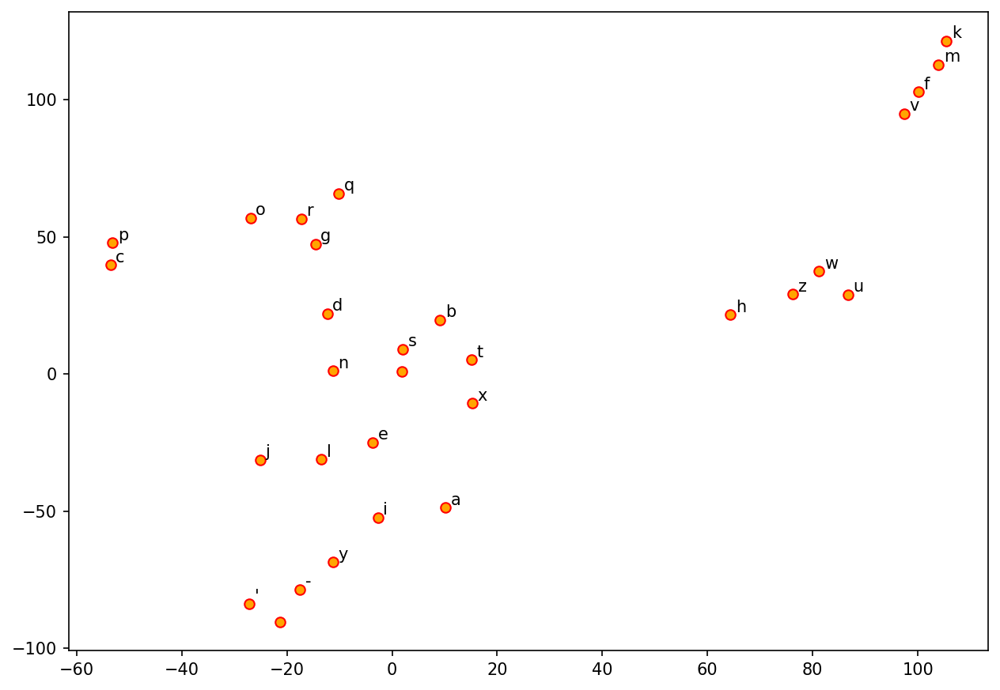

In [53]:
## Visulizing char embeddings via dimensional reduction techniques

tsne = TSNE(n_components=2, random_state=0, n_iter=5000, perplexity=3)
np.set_printoptions(suppress=True)

T = tsne.fit_transform(char_vectors)
labels = labels

plt.figure(figsize=(10, 7), dpi=150)
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label,
                 xy=(x + 1, y + 1),
                 xytext=(0, 0),
                 textcoords='offset points')

## Issues of Word/Character Representations

- One-hot encoding does not indicate semantic relationships between characters.
- For deep learning NLP, it is preferred to convert one-hot encodings of words/characters into **embeddings**, which are argued to include more semantic information of the tokens.
- Now the question is how to train and create better word embeddings. 
- There are at least two alternatives:
    - We can train the embeddings along with our current NLP task.
    - We can use pre-trained embeddings from other unsupervised learning (transfer learning).
- We will come back to this issue later.

## Hyperparameter Tuning

:::{note}

Please install keras tuner module in your current conda:

```
pip install -U keras-tuner
```

or 

```
conda install -c conda-forge keras-tuner
```

:::

- Like feature-based ML methods, neural networks also come with many **hyperparameters**, which require default values.
- Typical hyperparameters include:
    - Number of nodes for the layer
    - Learning Rates
- We can utilize the module, [`keras-tuner`](https://keras-team.github.io/keras-tuner/documentation/tuners/), to fine-tune these hyperparameters (i.e., to find the values that optimize the model performance).

- Steps for Keras Tuner
    - First, wrap the model definition in a function, which takes a single `hp` argument. 
    - Inside this function, replace any value we want to tune with a call to hyperparameter sampling methods, e.g. `hp.Int()` or `hp.Choice()`. The function should return a compiled model.
    - Next, instantiate a `tuner` object specifying our optimization objective and other search parameters.
    - Finally, start the search with the `search()` method, which takes the same arguments as `Model.fit()` in keras.
    - When the search is over, we can retrieve the best model and a summary of the results from the `tunner`.


In [54]:
## confirm if the right kernel is being used
# import sys
# sys.executable

In [55]:
## Wrap model definition in a function
## and specify the parameters needed for tuning
# def build_model(hp):
#     model1 = keras.Sequential()
#     model1.add(keras.Input(shape=(max_len,)))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_1"))
#     model1.add(layers.Dense(hp.Int('units', min_value=32, max_value=128, step=32), activation="relu", name="dense_layer_2"))
#     model1.add(layers.Dense(2, activation="softmax", name="output"))
#     model1.compile(
#         optimizer=keras.optimizers.Adam(
#             hp.Choice('learning_rate',
#                       values=[1e-2, 1e-3, 1e-4])),
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy'])
#     return model1

In [56]:
## wrap model definition and compiling

def build_model(hp):
    m = Sequential()
    m.add(
        layers.Embedding(
            input_dim=vocab_size,
            output_dim=hp.Int(
                'output_dim',  ## tuning 2
                min_value=32,
                max_value=128,
                step=32),
            input_length=max_len,
            mask_zero=True))
    m.add(
        layers.Bidirectional(
            layers.LSTM(
                hp.Int('units', min_value=16, max_value=64,
                       step=16),  ## tuning 1
                activation="relu",
                dropout=0.2,
                recurrent_dropout=0.2)))
    m.add(layers.Dense(1, activation="sigmoid", name="output"))

    m.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=["accuracy"])
    return m

In [57]:
## This is to clean up the temp dir from the tuner
## Every time we re-start the tunner, it's better to keep the temp dir clean

if os.path.isdir('my_dir'):
    shutil.rmtree('my_dir')

- The `max_trials` variable represents the maximum number of the hyperparameter combinations that will be tested by the tuner (because sometimes the combinations are too many and the max number can limit the time in fine-tuning).
- The `execution_per_trial` variable is the number of models that should be built and fit for each trial for robustness purposes (i.e., consistent results).

In [59]:
## Instantiate the tunner
import keras_tuner

tuner = keras_tuner.RandomSearch(build_model,
                                       objective='val_accuracy',
                                       max_trials=10,
                                       executions_per_trial=2,
                                       directory='my_dir')

In [60]:
## Check the tuner's search space
tuner.search_space_summary()

Search space summary
Default search space size: 2
output_dim (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': 'linear'}
units (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 64, 'step': 16, 'sampling': 'linear'}


In [61]:
%%time
## Start tuning with the tuner
tuner.search(X_train, y_train, validation_split=VALIDATION_SPLIT, batch_size=BATCH_SIZE)

Trial 10 Complete [00h 00m 15s]
val_accuracy: 0.643194317817688

Best val_accuracy So Far: 0.6447678804397583
Total elapsed time: 00h 02m 24s
INFO:tensorflow:Oracle triggered exit
CPU times: user 3min 44s, sys: 31.3 s, total: 4min 15s
Wall time: 2min 24s


In [62]:
## Retrieve the best models from the tuner
models = tuner.get_best_models(num_models=2)

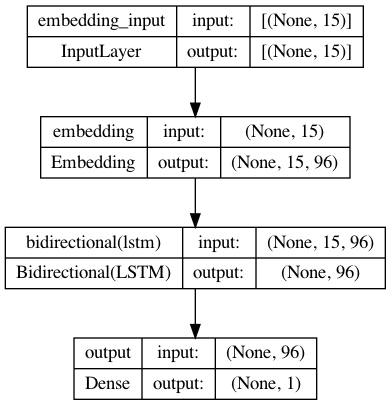

In [63]:
plot_model(models[0], show_shapes=True)

In [64]:
## Retrieve the summary of results from the tuner
tuner.results_summary()

Results summary
Results in my_dir/untitled_project
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 07 summary
Hyperparameters:
output_dim: 96
units: 48
Score: 0.6447678804397583

Trial 00 summary
Hyperparameters:
output_dim: 128
units: 32
Score: 0.6443744897842407

Trial 01 summary
Hyperparameters:
output_dim: 96
units: 32
Score: 0.6435877084732056

Trial 02 summary
Hyperparameters:
output_dim: 64
units: 64
Score: 0.643194317817688

Trial 03 summary
Hyperparameters:
output_dim: 64
units: 48
Score: 0.643194317817688

Trial 09 summary
Hyperparameters:
output_dim: 128
units: 16
Score: 0.643194317817688

Trial 04 summary
Hyperparameters:
output_dim: 32
units: 32
Score: 0.6428009271621704

Trial 05 summary
Hyperparameters:
output_dim: 64
units: 16
Score: 0.6428009271621704

Trial 06 summary
Hyperparameters:
output_dim: 32
units: 16
Score: 0.6428009271621704

Trial 08 summary
Hyperparameters:
output_dim: 64
units: 32
Score: 0.6428009271621704


## Explanation

### Train Model with the Tuned Hyperparameters

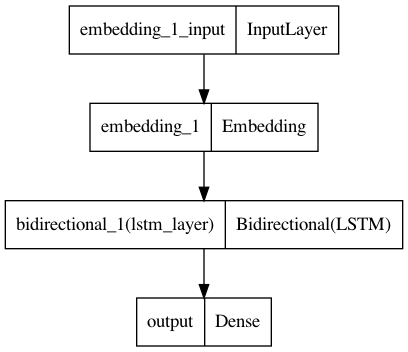

In [65]:
EMBEDDING_DIM = 128
HIDDEN_STATE=32
model6 = Sequential()
model6.add(
    layers.Embedding(input_dim=vocab_size,
                     output_dim=EMBEDDING_DIM,
                     input_length=max_len,
                     mask_zero=True))
model6.add(
    layers.Bidirectional(
        layers.LSTM(HIDDEN_STATE,
                    activation="relu",
                    name="lstm_layer",
                    dropout=0.2,
                    recurrent_dropout=0.5)))
model6.add(layers.Dense(1, activation="sigmoid", name="output"))

model6.compile(loss='binary_crossentropy',
               optimizer='adam',
               metrics=["accuracy"])
plot_model(model6)

In [66]:
history6 = model6.fit(X_train,
                      y_train,
                      batch_size=BATCH_SIZE,
                      epochs=EPOCHS,
                      verbose=2,
                      validation_split=VALIDATION_SPLIT)

Epoch 1/20


40/40 - 7s - loss: 0.6597 - accuracy: 0.6157 - val_loss: 0.6060 - val_accuracy: 0.6436 - 7s/epoch - 180ms/step
Epoch 2/20
40/40 - 1s - loss: 0.5688 - accuracy: 0.6780 - val_loss: 0.4629 - val_accuracy: 0.7836 - 1s/epoch - 25ms/step
Epoch 3/20
40/40 - 1s - loss: 0.4804 - accuracy: 0.7661 - val_loss: 0.4322 - val_accuracy: 0.8080 - 890ms/epoch - 22ms/step
Epoch 4/20
40/40 - 1s - loss: 0.4551 - accuracy: 0.7756 - val_loss: 0.4152 - val_accuracy: 0.8096 - 903ms/epoch - 23ms/step
Epoch 5/20
40/40 - 1s - loss: 0.4450 - accuracy: 0.7862 - val_loss: 0.4132 - val_accuracy: 0.8135 - 911ms/epoch - 23ms/step
Epoch 6/20
40/40 - 1s - loss: 0.4403 - accuracy: 0.7939 - val_loss: 0.4097 - val_accuracy: 0.8175 - 915ms/epoch - 23ms/step
Epoch 7/20
40/40 - 1s - loss: 0.4339 - accuracy: 0.7946 - val_loss: 0.4064 - val_accuracy: 0.8135 - 932ms/epoch - 23ms/step
Epoch 8/20
40/40 - 1s - loss: 0.4317 - accuracy: 0.7933 - val_loss: 0.4029 - val_accuracy: 0.8214 - 957ms/epoch - 24ms/step
Epoch 9/20
40/40 - 1s - 

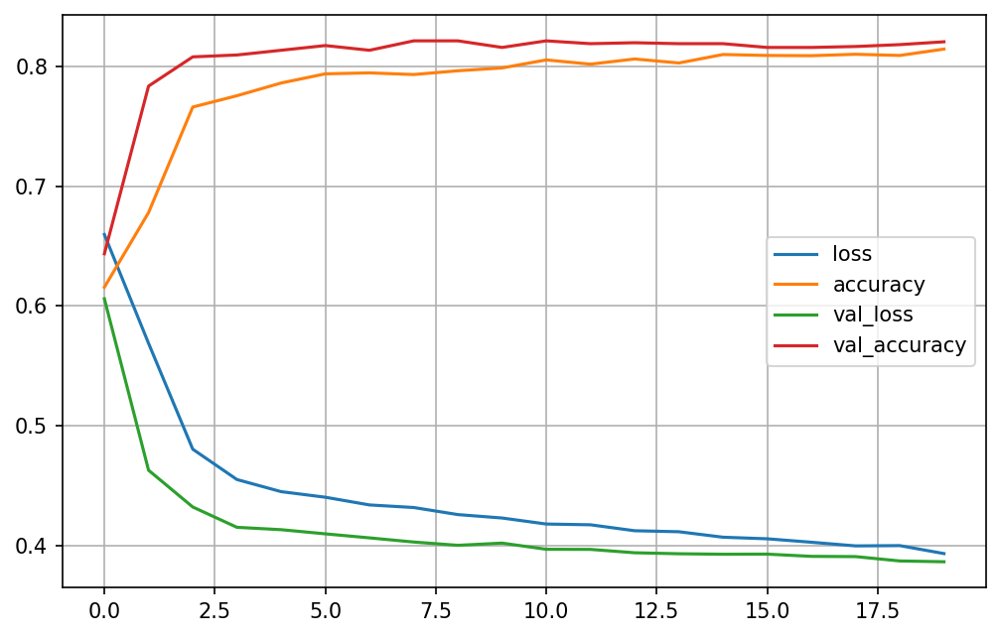

In [67]:
plot2(history6)

In [68]:
explainer = LimeTextExplainer(class_names=['female','male'], char_level=True)

In [69]:
def model_predict_pipeline(text_list):
    ## text_list: a list of training tokens (1d)
    ## output: a [d, k] array, d = number of input strings; k = 2 (probs of the two classes)
    ## Note: To use `explainer.explain_instance`, we need a predictor, which takes a LIST of tokens as input, and returns a list of (1-x, x) class probablities 
    _seq = tokenizer.texts_to_sequences(text_list) ## treat the entire string as one unit
    _seq_pad = keras.preprocessing.sequence.pad_sequences(_seq, maxlen=max_len)
    _out_prob = model6.predict(_seq_pad)[:,0].tolist() ## predict() requires a 2d array as input and returns a 2D array
    return np.array([[float(1-x), float(x)] for x in _out_prob])
    #return model6.predict(np.array(_seq_pad))

In [70]:
text_id = 13
print(X_test_texts[text_id]) ## Suset of a specific string from a list
model_predict_pipeline([X_test_texts[text_id]]) ## Remember to convert STRING to LIST (length=1)

Hakeem


1/1 [==============================] - 1s 541ms/step


array([[0.08544964, 0.91455036]])

In [71]:
exp = explainer.explain_instance(X_test_texts[text_id], ## requires a raw string
                                 model_predict_pipeline, ## reqires a predictor with list as input
                                 num_features=10,
                                 top_labels=1)

157/157 [==============================] - 0s 3ms/step


In [72]:
exp.show_in_notebook(text=True)

In [73]:
y_test[text_id]

1

In [74]:
exp = explainer.explain_instance('Tim',
                                 model_predict_pipeline,
                                 num_features=10,
                                 top_labels=1)
exp.show_in_notebook(text=True)

 19/157 [==>...........................] - ETA: 0s

157/157 [==============================] - 0s 3ms/step


In [75]:
exp = explainer.explain_instance('Michaelis',
                                 model_predict_pipeline,
                                 num_features=10,
                                 top_labels=1)
exp.show_in_notebook(text=True)

157/157 [==============================] - 0s 3ms/step


In [76]:
exp = explainer.explain_instance('Sidney',
                                 model_predict_pipeline,
                                 num_features=10,
                                 top_labels=1)
exp.show_in_notebook(text=True)

157/157 [==============================] - 0s 3ms/step


In [77]:
exp = explainer.explain_instance('Timber',
                                 model_predict_pipeline,
                                 num_features=10,
                                 top_labels=1)
exp.show_in_notebook(text=True)

157/157 [==============================] - 0s 3ms/step


In [78]:
exp = explainer.explain_instance('Alvin',
                                 model_predict_pipeline,
                                 num_features=10,
                                 top_labels=1)
exp.show_in_notebook(text=True)

157/157 [==============================] - 0s 3ms/step


## References

- Chollet (2017), Ch 3 and  Ch 4